In [1]:
from datetime import date
from glob import glob
import os, sys
from os.path import join, dirname
from tqdm import tqdm

import pickle as pkl
import numpy as np
import pandas as pd
import seaborn as sns
import statsmodels.stats.multitest

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from matplotlib import patches, lines

from scipy import optimize, stats

from nilearn import plotting, masking, image
from nilearn.input_data import NiftiLabelsMasker

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import confusion_matrix, classification_report, auc
from sklearn.preprocessing import StandardScaler

# import pingouin as pg

import random
# from random import random as rand

import re

/home/sungbeenpark/.local/lib/python3.10/site-packages/nilearn/input_data/__init__.py:23: FutureWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  warnings.warn(message, FutureWarning)


In [2]:
%matplotlib inline

In [3]:
def convert_pvalue_to_asterisks(pvalue):
    if pvalue <= 0.0001:
        return "****"
    elif pvalue <= 0.001:
        return "***"
    elif pvalue <= 0.01:
        return "**"
    elif pvalue <= 0.05:
        return "*"
    return "ns"

In [4]:
dir_root = join('/mnt/ext4/GL/fmri_data')
dir_stat = join(dir_root,'stats/AM/GLM.reward_per_trial/4.0s_shifted')
dir_mask = join(dir_root,'masks')

---

## fig 2-a.

In [5]:
p_thresh = 5.e-3
z_thresh = stats.norm.isf(0.5*p_thresh)
print(z_thresh)

2.8070337683438042


/usr/local/fsl/lib/python3.10/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



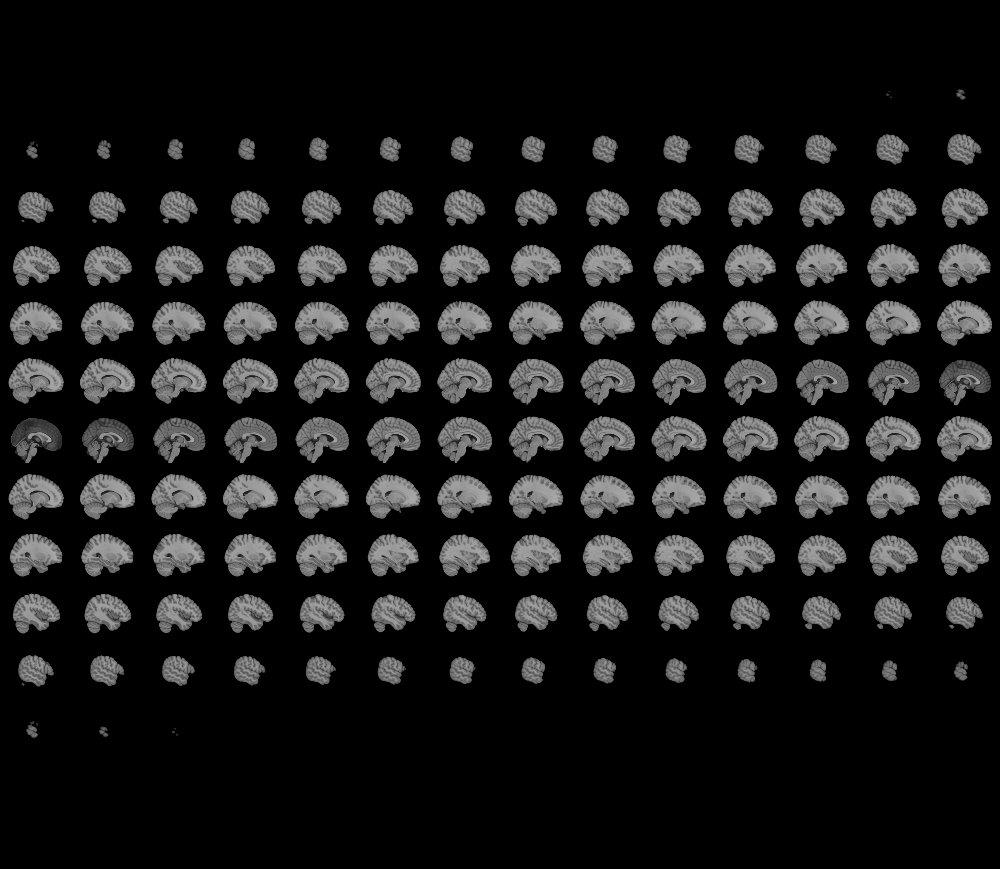
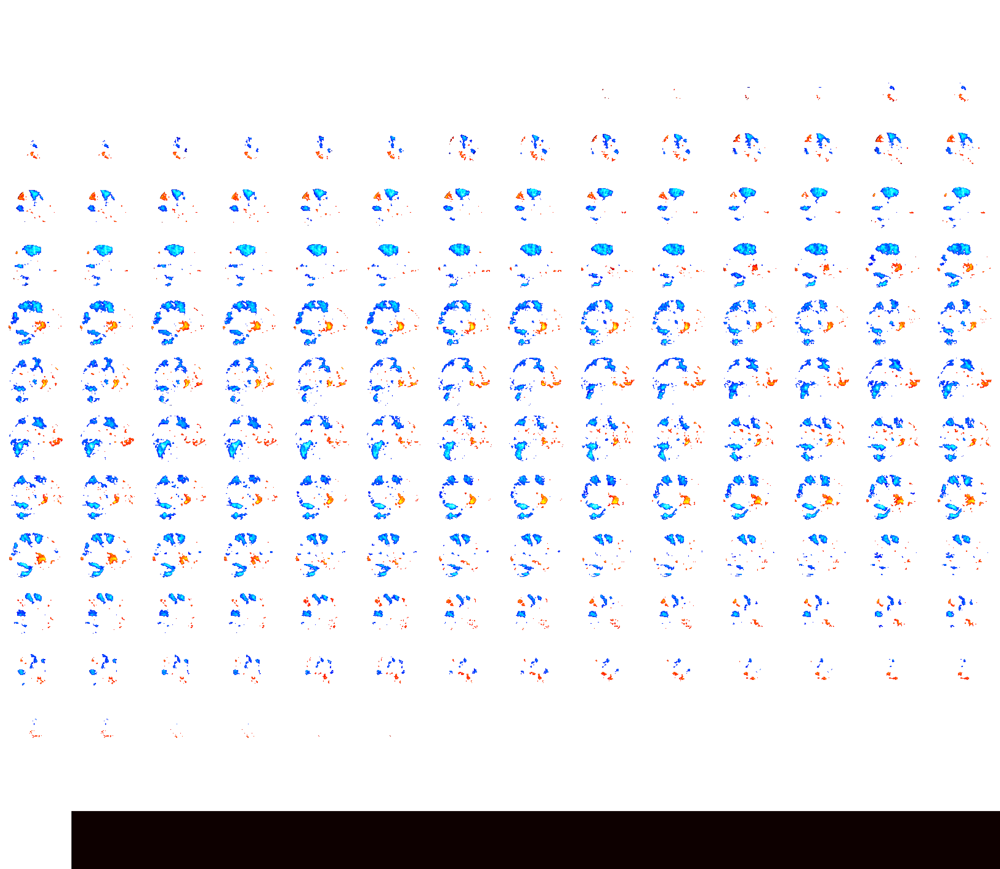

In [6]:
fname_stat = join(dir_stat,'Zscr.reward.On.n24.nii')

plotting.view_img(
    fname_stat
    , threshold=z_thresh
#     , vmax=6.8
)

/usr/local/fsl/lib/python3.10/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



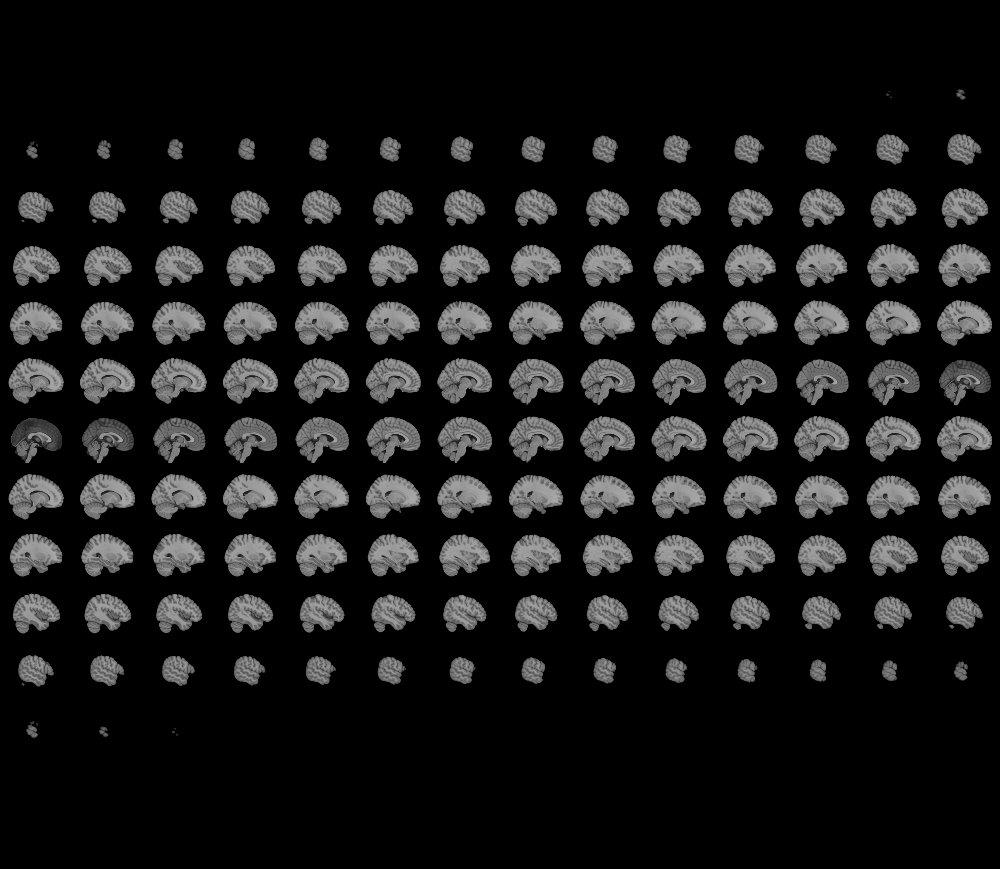
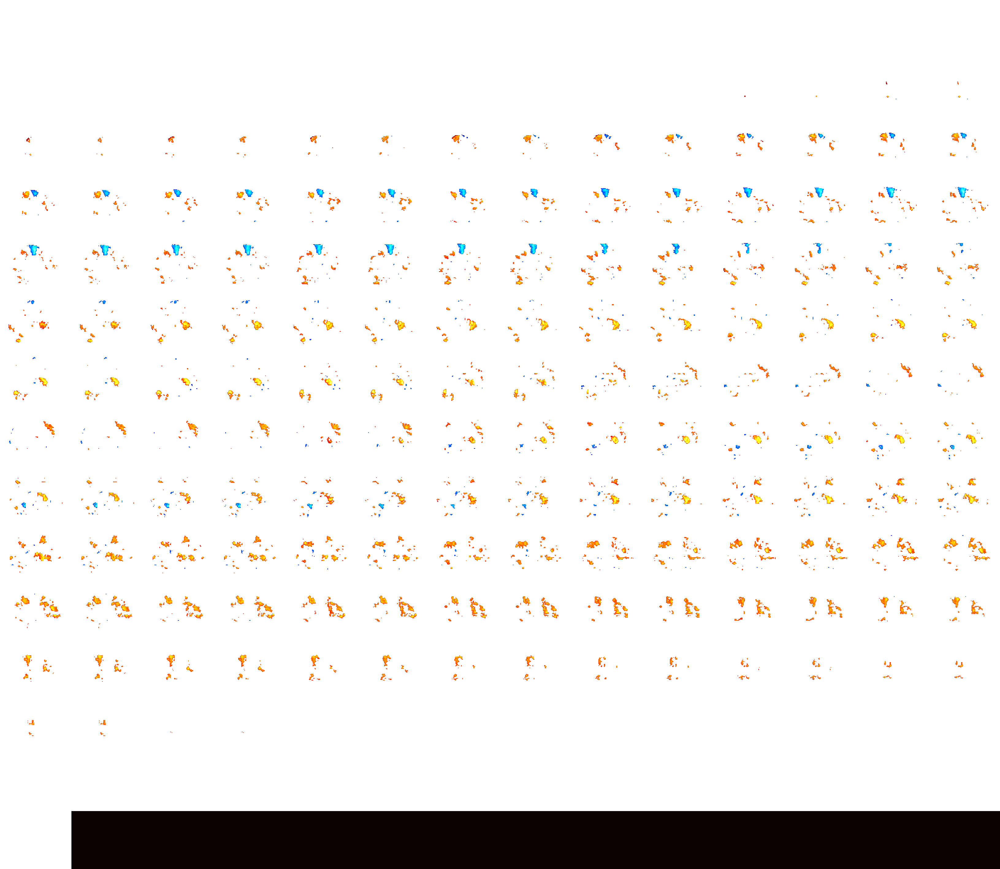

In [7]:
fname_stat = join(dir_stat,'Zscr.reward.Off.n24.nii')

plotting.view_img(
    fname_stat
    , threshold=z_thresh
#     , vmax=6.8
)

/usr/local/fsl/lib/python3.10/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



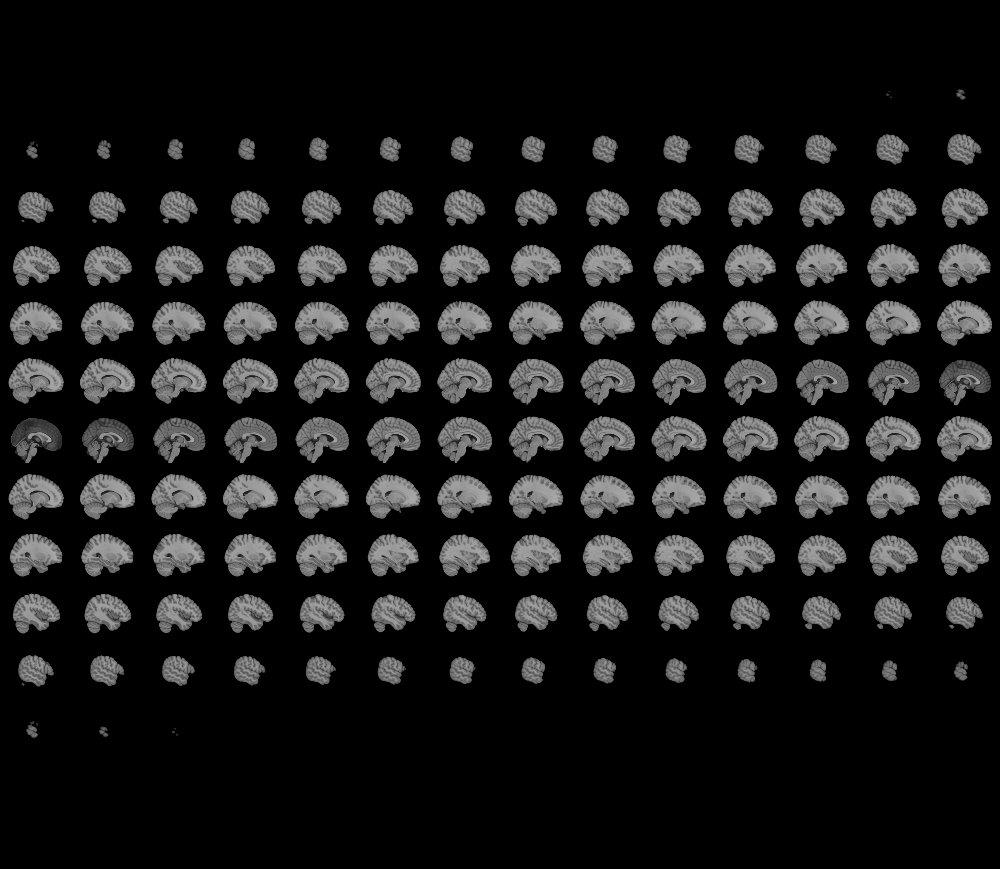
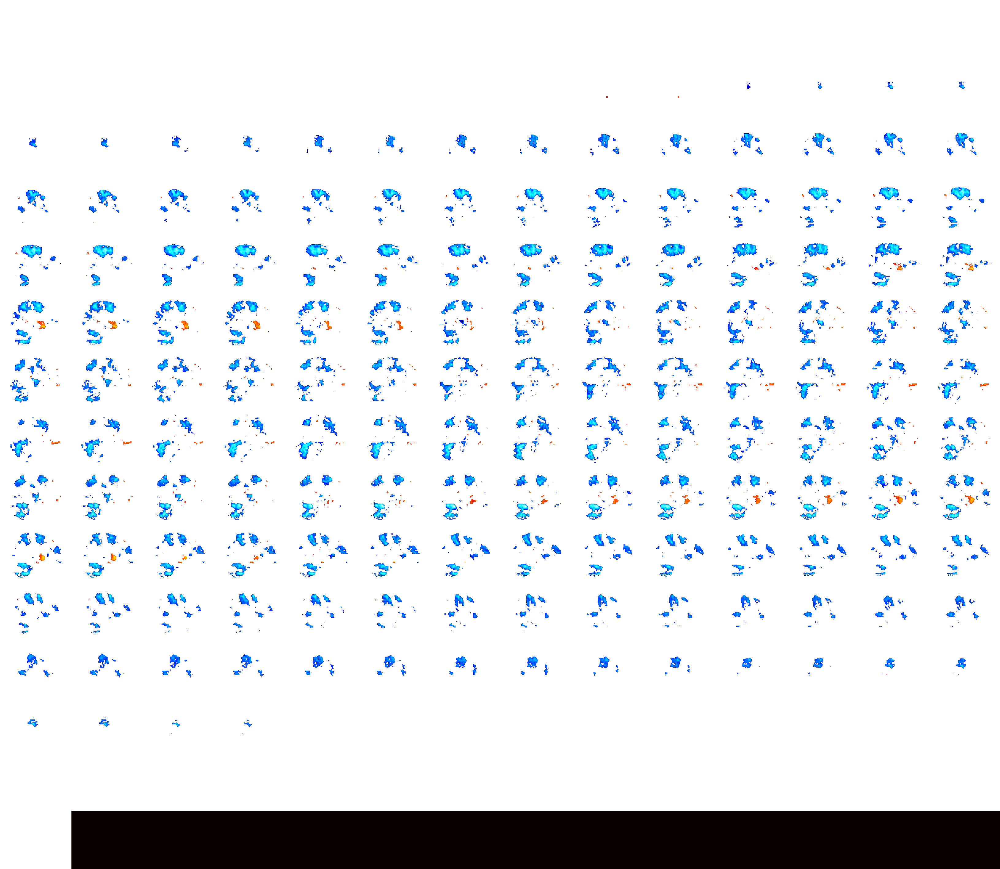

In [8]:
fname_stat = join(dir_stat,'Zscr.reward.Test.n24.nii')

plotting.view_img(
    fname_stat
    , threshold=z_thresh
#     , vmax=6.8
)

In [9]:
vmax=6.8

In [10]:
axials = [-5, -2, 2, 7, 10, 44, 55]

(0.0, 1.0)

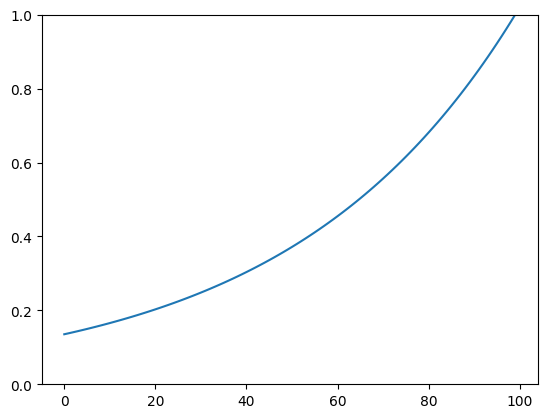

In [11]:
y = np.exp(np.linspace(-2, 0, 100))
plt.plot(y)
plt.ylim(0,1)

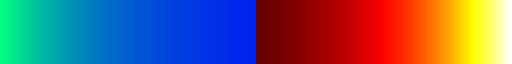

In [12]:
cmap = colors.ListedColormap(
    np.concatenate(
        [
            np.flip(cm.winter(y), axis=0)
            , cm.hot(y)
        ]
        , axis=0
    )
)
cmap

100%|██████████| 7/7 [00:18<00:00,  2.71s/it]


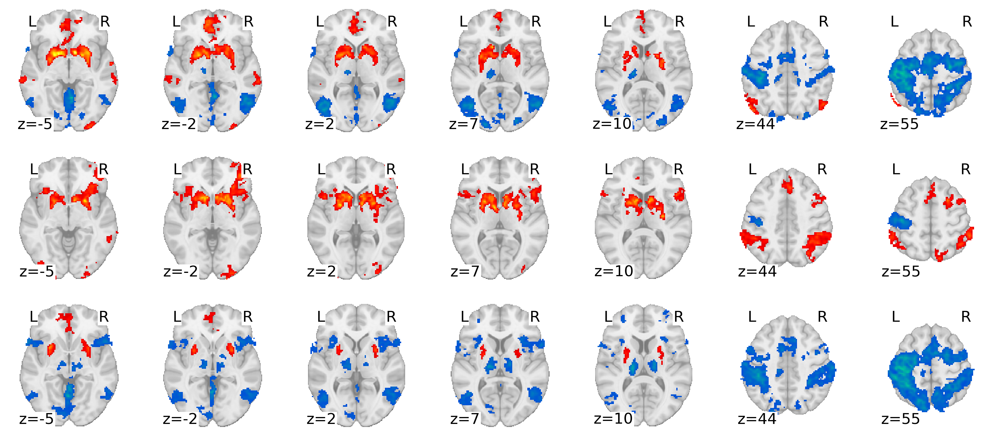

In [13]:
list_cond = ['On', 'Off','Test']

nrows = len(list_cond)
ncols = len(axials)
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(2*ncols,2*nrows), dpi=300)

for ii, cond in enumerate(list_cond):
    for jj, z in enumerate(tqdm(axials)):
        ax = axs[ii][jj]
        fname_stat = join(dir_stat,'Zscr.reward.%s.n24.nii'%cond)
        
        img_stat = image.threshold_img(
            fname_stat,
            threshold=z_thresh,
            cluster_threshold=140,
            two_sided=True
        )
        
        g = plotting.plot_stat_map(
            img_stat
            , display_mode='z'
            , cut_coords=[z]
            , symmetric_cbar=False, vmax=vmax
            , cmap=cmap, colorbar=False
            , axes=ax
        )

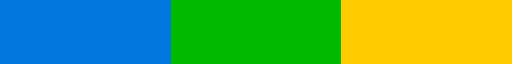

In [14]:
tmp = cm.nipy_spectral.resampled(5)
palette = tmp(np.linspace(0,1,6))[1:4]
colors.ListedColormap(palette)

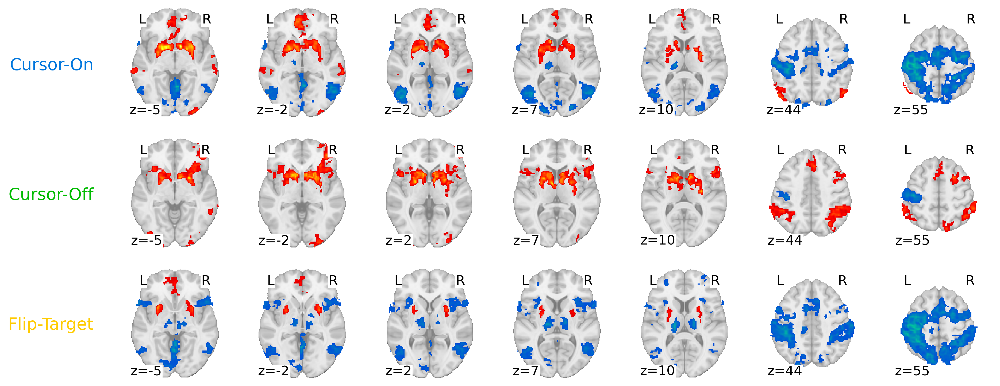

In [15]:
list_ = ['Cursor-On', 'Cursor-Off', 'Flip-Target']

## titles
for ii, cond in enumerate(list_cond):
    color = palette[ii]
    cond = list_[ii]
    x = 0.1
    y = 1.03 - 0.27 * (ii+1)
    fig.text(
        x, y,
        cond, size=15, rotation=0, color=color,
        ha='right', va='center',
#         bbox=dict(
#             boxstyle='round'
#             , ec=color
#             , fc=colors.to_rgb(color)/np.max(colors.to_rgb(color))
#         )
    )
    
fig

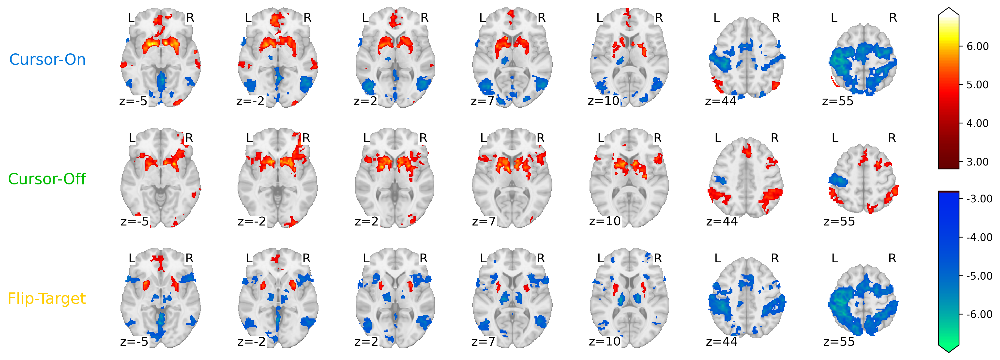

In [16]:
################
## upper cmap ##
################

### 컬러바 생성
colormapping = cm.ScalarMappable(
    norm=colors.Normalize(vmin=z_thresh, vmax=vmax),
    cmap=colors.ListedColormap(cmap(np.linspace(0.5, 1, 100)))
)
### 컬러바 삽입
cax = fig.add_axes([0.925, 0.515, .02, 0.365])
cbar = fig.colorbar(
    colormapping, extend='max'
    , orientation='vertical'
    , format='%.2f'
    , cax=cax
)

################
## lower cmap ##
################

### 컬러바 생성
colormapping = cm.ScalarMappable(
    norm=colors.Normalize(vmin=-vmax, vmax=-z_thresh),
    cmap=colors.ListedColormap(cmap(np.linspace(0, 0.5, 100)))
)
### 컬러바 삽입
cax = fig.add_axes([0.925, 0.1, .02, 0.365])
cbar = fig.colorbar(
    colormapping, extend='min'
    , orientation='vertical'
    , format='%.2f'
    , cax=cax
)

fig

In [49]:
# fig.savefig(
#     '/home/sungbeenpark/Github/labs/GL/results/fig.2-a.png'
#     , dpi=300, facecolor=[1,1,1,1]
#     , bbox_inches = "tight"
# )

---

## fig 2-b.

In [24]:
fname_roi = {}
fname_roi['full'] = join(dir_mask, 'full_mask.GL+tlrc.nii')
fname_roi['striatum'] = join(dir_mask, 'mask.striatum.nii')

/usr/local/fsl/lib/python3.10/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



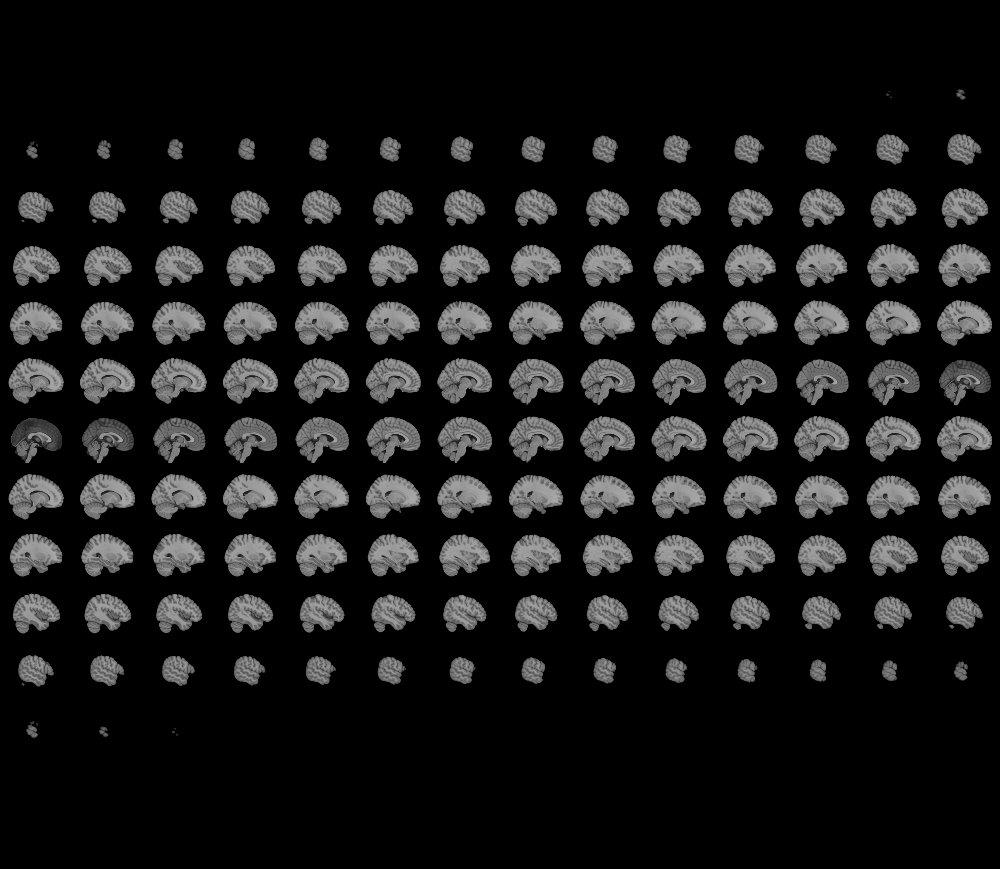
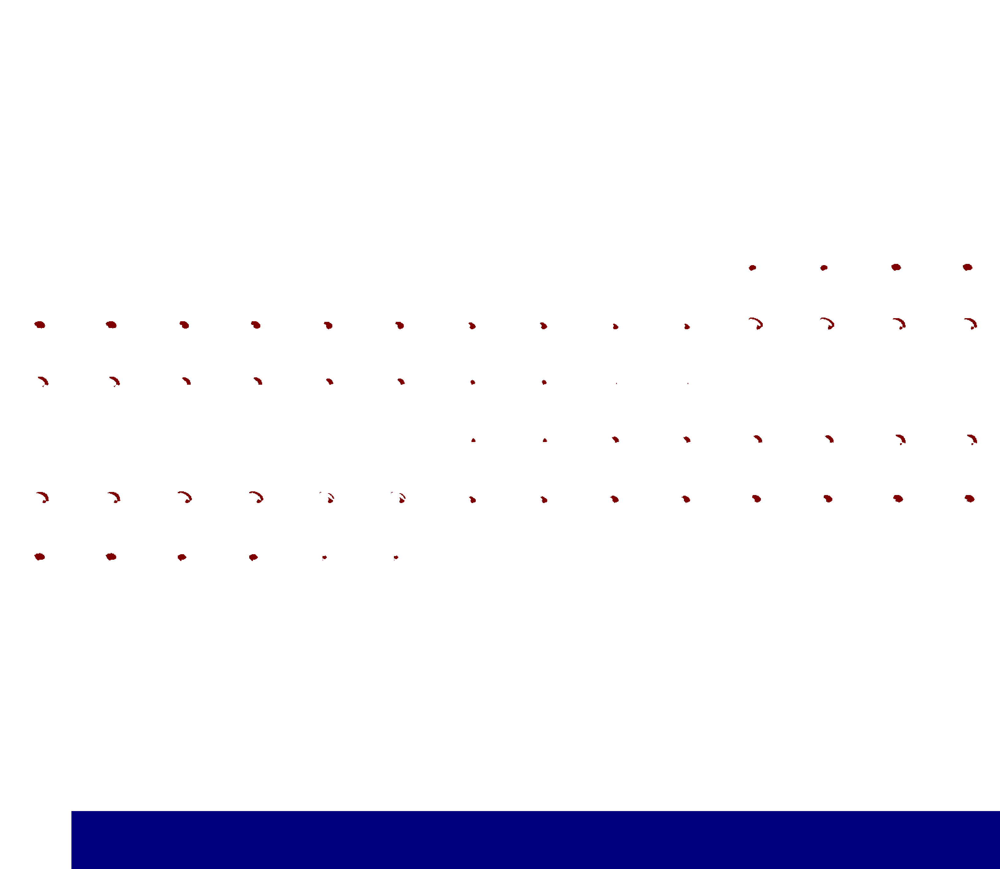

In [25]:
plotting.view_img(
    stat_map_img=fname_roi['striatum']
    , cmap=cm.jet.resampled(2)
    , symmetric_cmap=False
    , resampling_interpolation='nearest'
    , opacity=0.7
)

In [26]:
img_roi = {}
for region, fname in fname_roi.items():
    img_roi[region] = image.load_img(img=fname)

In [27]:
pval = 1.e-3
z_th = stats.norm.isf(pval*0.5)

In [28]:
img_stat = {}
for ii, cond in enumerate(['On','Off','Test']):
    fname = join(dir_stat,'Zscr.reward.%s.n24.nii'%cond)
    img_stat[cond] = image.load_img(fname)

/usr/local/fsl/lib/python3.10/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



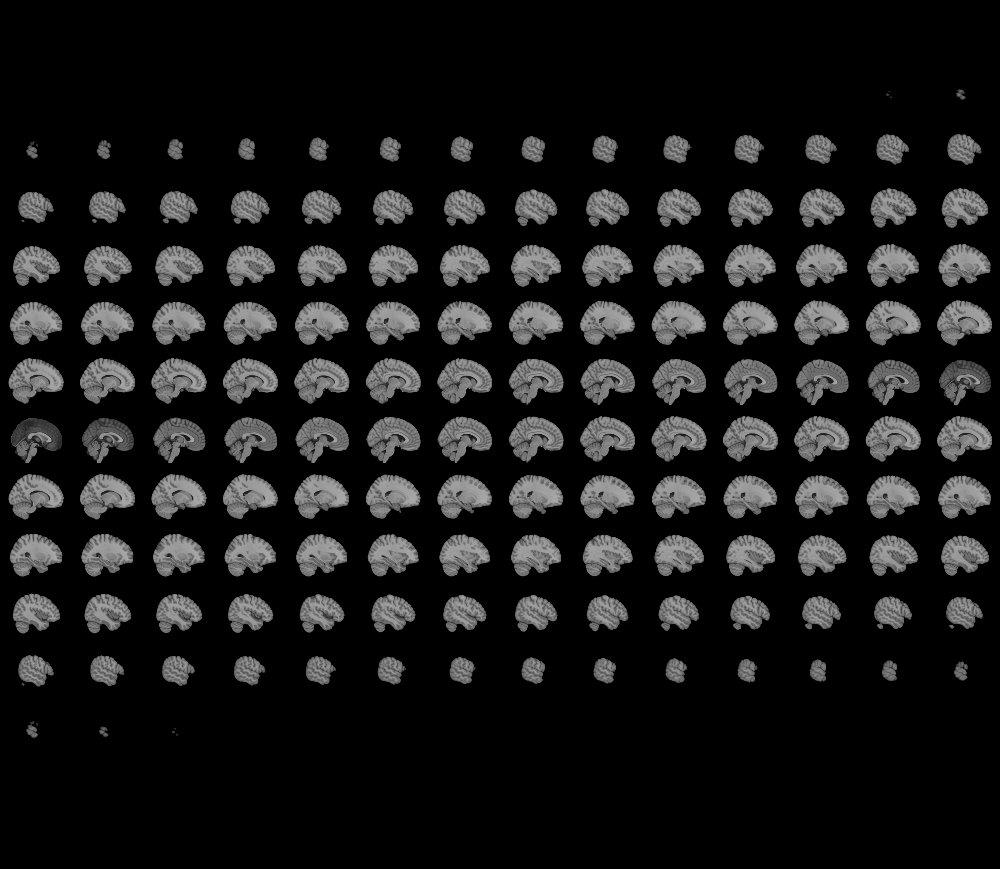
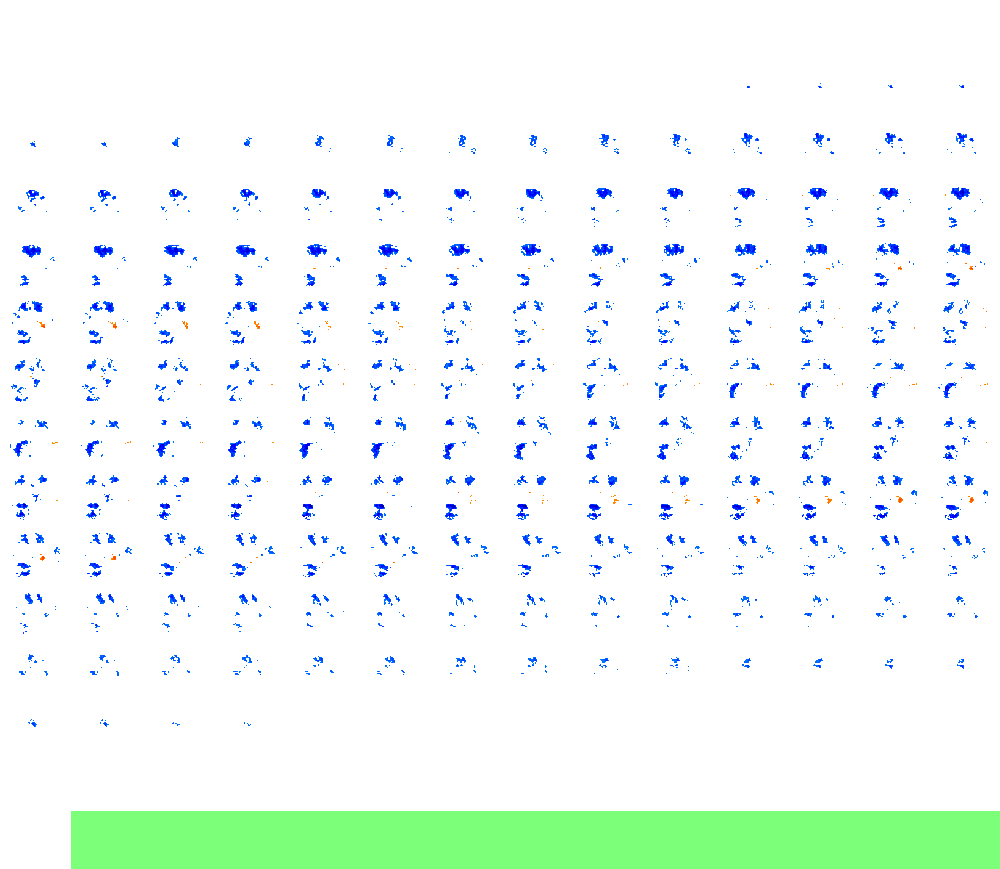

In [29]:
plotting.view_img(
    stat_map_img=img_stat['Test'],
    cmap=cm.jet,
    threshold=z_th,
    symmetric_cmap=True,
    resampling_interpolation='nearest',
    opacity=0.7,
)

True Positive: $MAP_{striatum} \cap MAP_{fMRI}$ = $MAP_{striatum} \cap MAP_{fMRI>Z_{threshold}}$

False Positive: $MAP^{c}_{striatum} \cap MAP_{fMRI}$ = $(MAP_{full}-MAP_{striatum}) \cap MAP_{fMRI>Z_{threshold}}$

True Negative: $MAP^{c}_{striatum} \cap MAP^{c}_{fMRI}$ = $(MAP_{full}-MAP_{striatum}) \cap MAP_{fMRI<Z_{threshold}}$

False Negative: $MAP_{striatum} \cap MAP^{c}_{fMRI}$ = $MAP_{striatum} \cap MAP_{fMRI<Z_{threshold}}$

In [30]:
## Grinding
TPR = {}
FPR = {}
for cond, img in img_stat.items():
    TPR[cond] = []
    FPR[cond] = []
    for z_th in np.linspace(start=-8., stop=8., num=33):
        ## True Positive
        TP = img.get_fdata()[img_roi['striatum'].get_fdata()>0]
        TP = TP[TP >= z_th]

        ## False Positive (full_mask>0 & striatum==0 -> reverse straitum)
        FP = img.get_fdata()[(img_roi['full'].get_fdata()>0)&(img_roi['striatum'].get_fdata()==0)]
        FP = FP[FP >= z_th]

        ## True Negative
        TN = img.get_fdata()[(img_roi['full'].get_fdata()>0)&(img_roi['striatum'].get_fdata()==0)]
        TN = TN[TN < z_th]

        ## False Negative
        FN = img.get_fdata()[img_roi['striatum'].get_fdata()>0]
        FN = FN[FN < z_th]

        TPR[cond].append(TP.shape[0]/(FN.shape[0]+TP.shape[0]))
        FPR[cond].append(FP.shape[0]/(TN.shape[0]+FP.shape[0]))

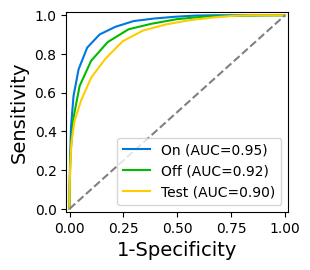

In [31]:
list_cond = ['On','Off','Test']

fig, ax = plt.subplots(figsize=np.array([4, 3.5])*0.8)

for ii, cond in enumerate(list_cond):
    AUC = auc(FPR[cond], TPR[cond])
    ax.plot(FPR[cond], TPR[cond], '-', color=palette[ii], label='%s (AUC=%.2f)'%(cond,AUC))
#     ax.text(0.25, 0.75, 'AUC=%.2f'%AUC, color=palette[ii])

ax.legend(loc='lower right')
ax.plot([0,1],[0,1], ls='--', color='gray')
ax.set_ylabel("Sensitivity", fontsize=14)
ax.set_xlabel("1-Specificity", fontsize=14)
ax.set(xlim=(-.015,1.015), ylim=(-0.015,1.015))

fig.tight_layout()

In [55]:
# fig.savefig(
#     '/home/sungbeenpark/Github/labs/GL/results/fig.2-b.png'
#     , dpi=300, facecolor=[1,1,1,1]
#     , bbox_inches = "tight"
# )